# Analysis of OSM tags

In [1]:
import geopandas as gpd
import matplotlib.pyplot as plt
import pickle
import json
import pandas as pd
import seaborn as sns
import plotly.express as px
import pandas as pd
from pysal.explore import esda
from pysal.lib import weights
from splot.esda import lisa_cluster

from src import evaluation_functions as eval_func

%run ../settings/yaml_variables.py
%run ../settings/df_styler.py
%run ../settings/plotting.py
%run ../settings/load_osmdata.py
%run ../settings/paths.py


/opt/miniconda3/envs/bikedna_analysis/lib/python3.11/site-packages/pysal/explore/segregation/network/network.py:15: UserWarning: You need pandana and urbanaccess to work with segregation's network module
You can install them with  `pip install urbanaccess pandana` or `conda install -c udst pandana urbanaccess`
  warn(
/opt/miniconda3/envs/bikedna_analysis/lib/python3.11/site-packages/pysal/model/spvcm/abstracts.py:10: UserWarning: The `dill` module is required to use the sqlite backend fully.
  from .sqlite import head_to_sql, start_sql


OSM data loaded successfully!


In [2]:
# Read intrinsic grid results
with open(
    f"../results/OSM/{study_area}/data/grid_results_intrinsic.pickle", "rb"
) as fp:
    osm_intrinsic_grid = pickle.load(fp)

osm_intrinsic_grid.dropna(subset='count_osm_edges',inplace=True)

# Import intrinsic results
osm_intrinsic_file = open(
    f"../results/OSM/{study_area}/data/intrinsic_analysis.json"
)

osm_intrinsic_results = json.load(osm_intrinsic_file)

# Import summary dataframe
summarize_results_df = pd.read_csv(f"../results/OSM/{study_area}/data/intrinsic_summary_results.csv",index_col=0)

summarize_results_df.style.pipe(format_osm_style)

,
Total infrastructure length (km),"20,681"
Protected bicycle infrastructure density (m/km2),386
Unprotected bicycle infrastructure density (m/km2),60
Mixed protection bicycle infrastructure density (m/km2),1
Bicycle infrastructure density (m/km2),446
Nodes,"90,804"
Dangling nodes,"46,426"
Nodes per km2,2
Dangling nodes per km2,1
Incompatible tag combinations,37


## Spatial patterns in existing tags

In [7]:
rename_dict = {
    "existing_tags_surface_length_pct_missing":"surface_length_pct_missing",
    "existing_tags_width_length_pct_missing":"width_length_pct_missing",
    "existing_tags_speedlimit_length_pct_missing":"speedlimit_length_pct_missing",
    "existing_tags_lit_length_pct_missing":"lit_length_pct_missing",
    "existing_tags_surface_count_pct_missing":"surface_count_pct_missing",
    "existing_tags_width_count_pct_missing":"width_count_pct_missing",
    "existing_tags_speedlimit_count_pct_missing":"speedlimit_count_pct_missing",
    "existing_tags_lit_count_pct_missing":"lit_count_pct_missing",
    "existing_tags_surface_length_pct":"surface_length_pct",
    "existing_tags_width_length_pct":"width_length_pct",
    "existing_tags_speedlimit_length_pct":"speedlimit_length_pct",
    "existing_tags_lit_length_pct":"lit_length_pct",
    "existing_tags_surface_count_pct":"surface_count_pct",
    "existing_tags_width_count_pct":"width_count_pct",
    "existing_tags_speedlimit_count_pct":"speedlimit_count_pct",
    "existing_tags_lit_count_pct":"lit_count_pct"
}


osm_intrinsic_grid.rename(rename_dict,inplace=True,axis=1)

/opt/miniconda3/envs/bikedna_analysis/lib/python3.11/site-packages/pysal/lib/weights/weights.py:170: UserWarning: The weights matrix is not fully connected. There are 21 components
  warnings.warn("The weights matrix is not fully connected. There are %d components" % self.n_components)


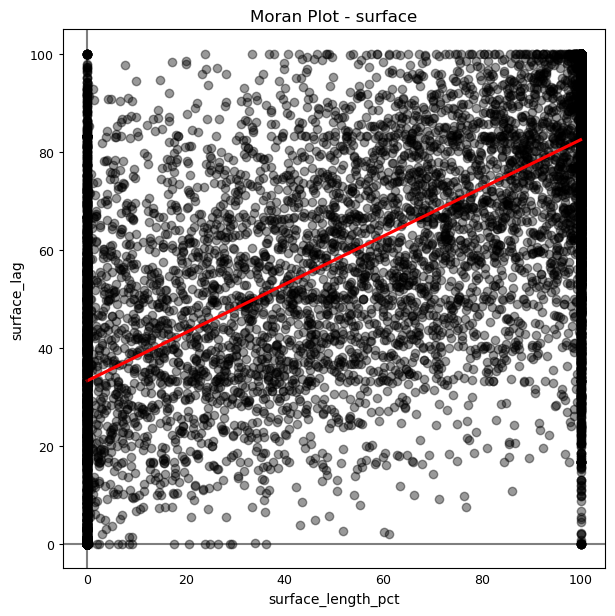

With significance 0.001, the Moran's I value for surface is 0.49


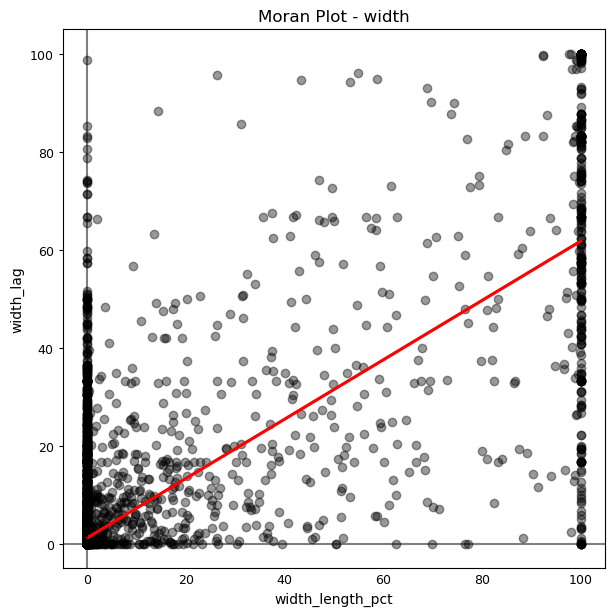

With significance 0.001, the Moran's I value for width is 0.61


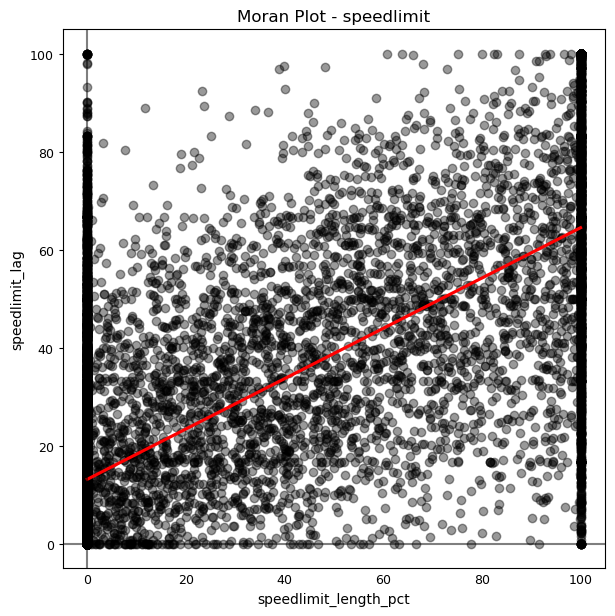

With significance 0.001, the Moran's I value for speedlimit is 0.51


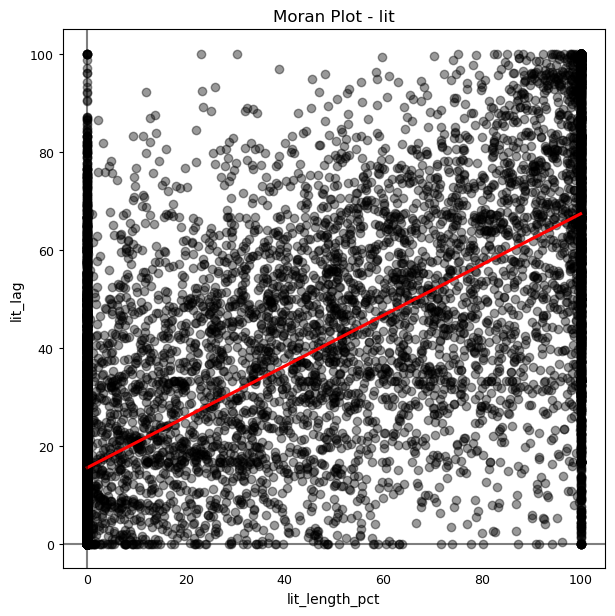

With significance 0.001, the Moran's I value for lit is 0.52


In [10]:
pct_length_existing = ['surface_length_pct','width_length_pct','speedlimit_length_pct','lit_length_pct']

col_names = pct_length_existing
variable_names = ['surface','width','speedlimit','lit']
filepaths = [osm_analysis_fp+"morans_surface.png", osm_analysis_fp+"morans_width.png", osm_analysis_fp+"morans_speedlimit.png",osm_analysis_fp+"morans_lit.png"]

w = eval_func.compute_spatial_weights(osm_intrinsic_grid, ["count_osm_edges"], "knn")

morans_tags = eval_func.compute_spatial_autocorrelation(col_names, variable_names, osm_intrinsic_grid, w, filepaths)


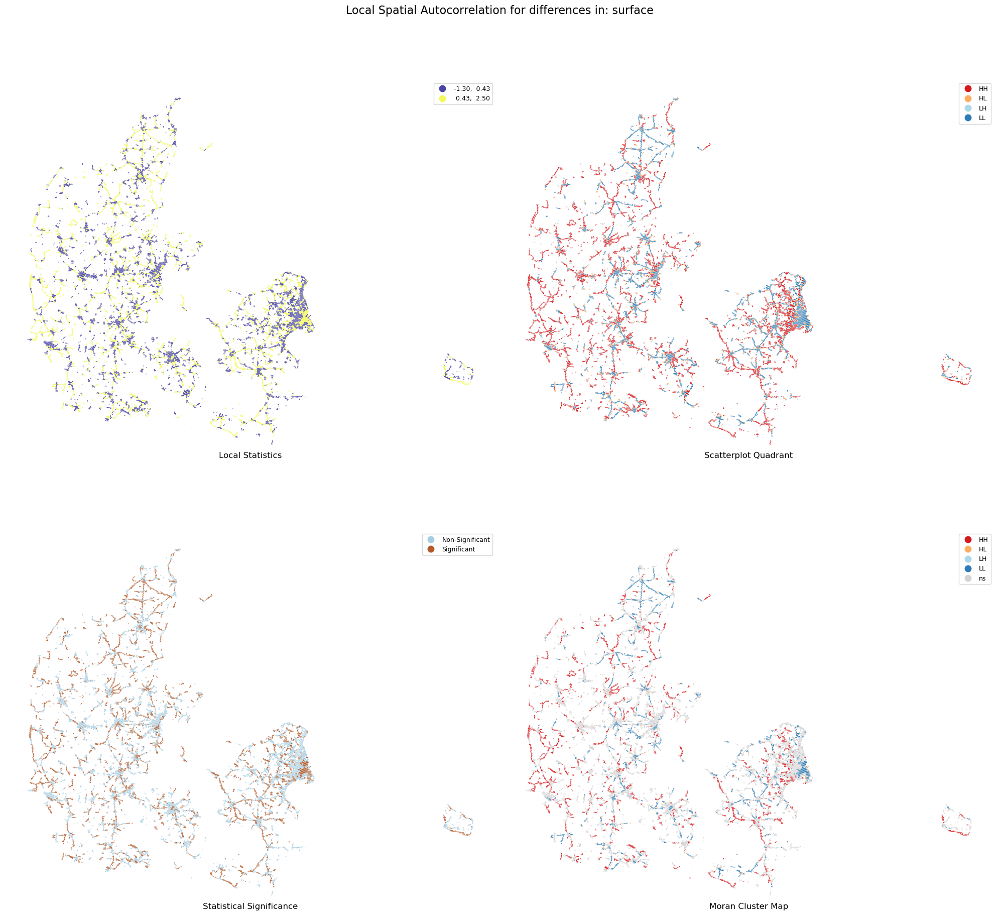

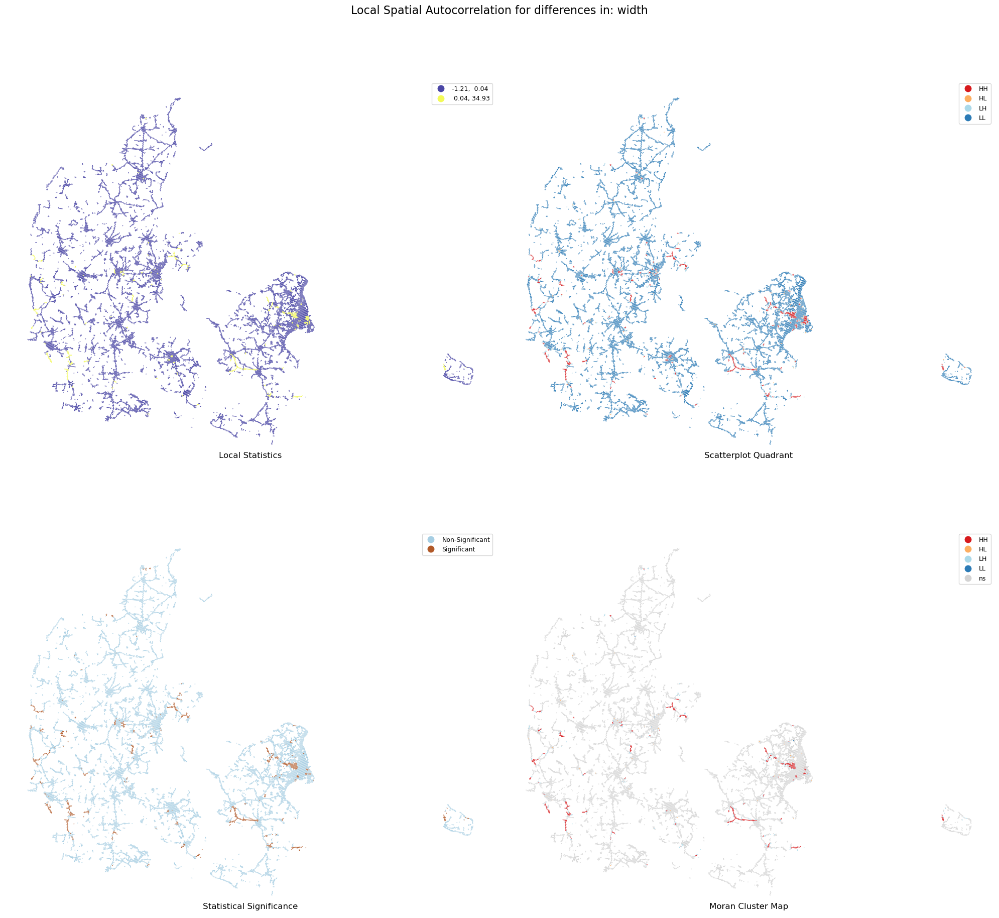

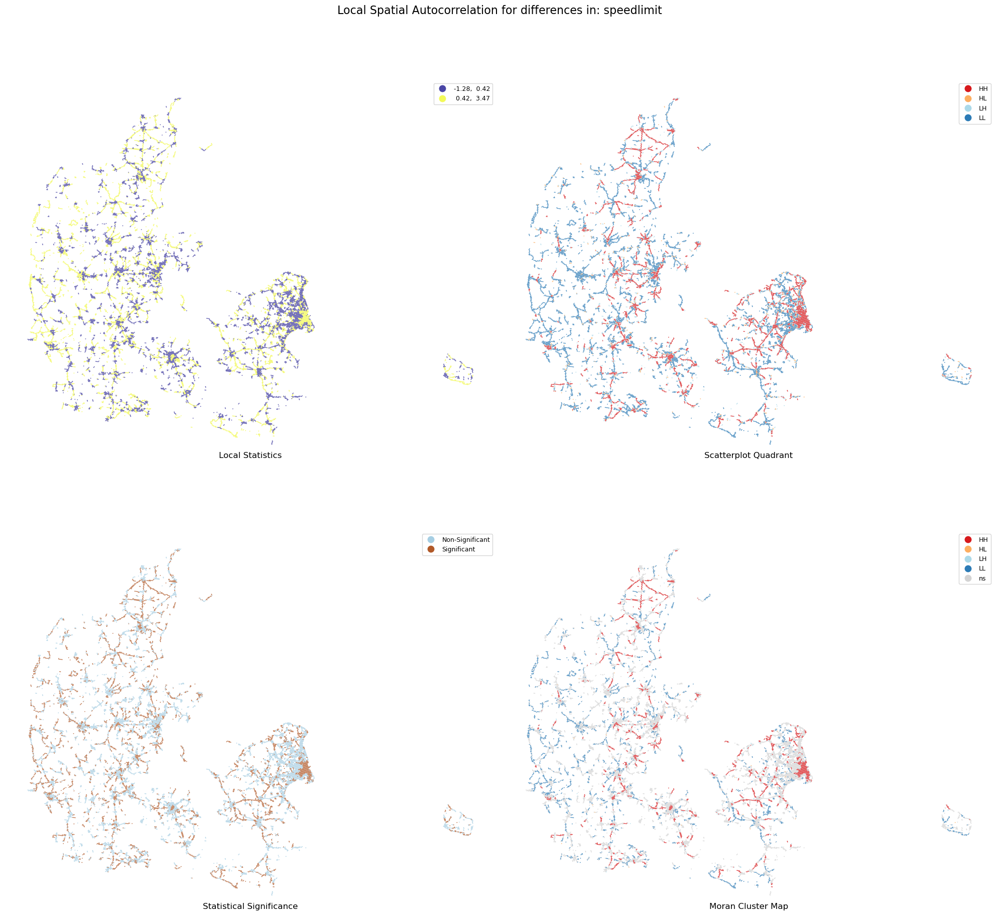

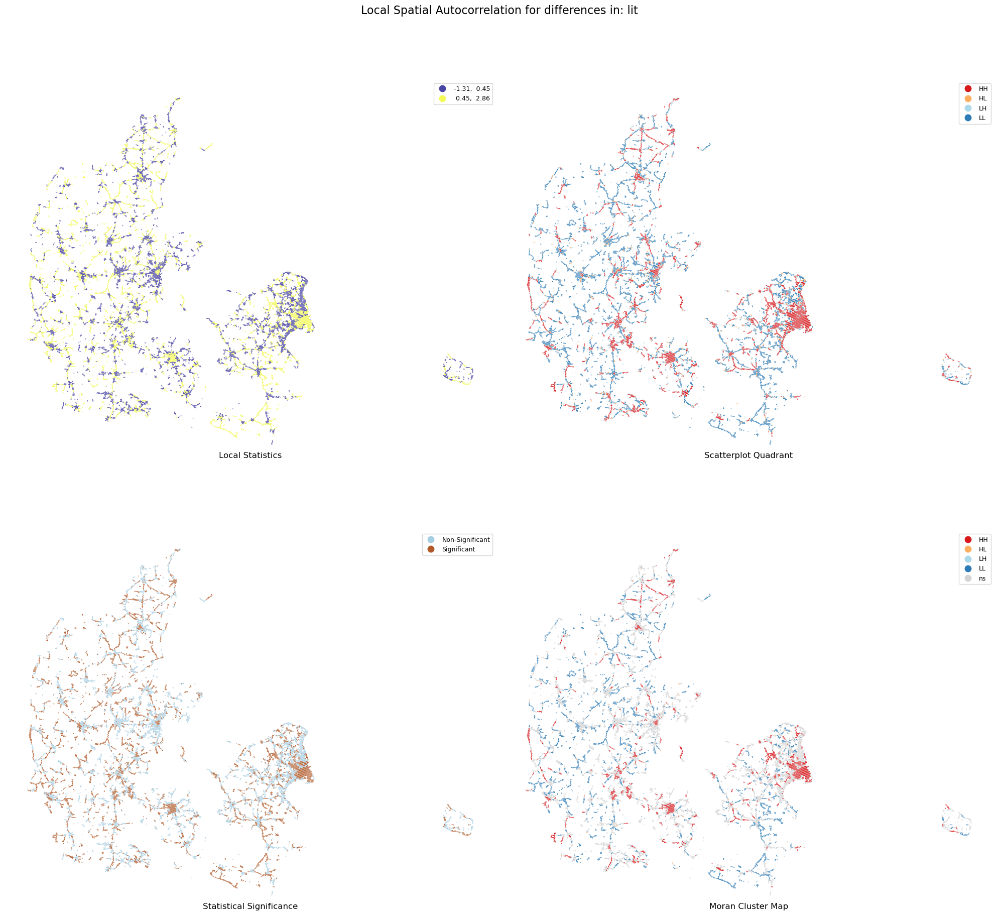

In [11]:
col_names = pct_length_existing
variable_names = ['surface','width','speedlimit','lit']
filepaths = [osm_analysis_fp+"lisa_surface.png", osm_analysis_fp+"lisa_width.png", osm_analysis_fp+"lisa_speedlimit.png",osm_analysis_fp+"lisa_lit.png"]

lisas_tags = eval_func.compute_lisa(col_names, variable_names, osm_intrinsic_grid, w,filepaths)

In [12]:
for v in variable_names:
    hotspot = len(osm_intrinsic_grid[osm_intrinsic_grid[f"{v}_q"]=="HH"])
    coldspot = len(osm_intrinsic_grid[osm_intrinsic_grid[f"{v}_q"]=="LL"])

    print(f"For the tag '{v}', {hotspot} out of {len(osm_intrinsic_grid)} grid cells ({hotspot/len(osm_intrinsic_grid)*100:.2f}%) are part of a hotspot.")
    print(f"For the tag '{v}', {coldspot} out of {len(osm_intrinsic_grid)} grid cells ({coldspot/len(osm_intrinsic_grid)*100:.2f}%) are part of a coldspot.")
    print("\n")

For the tag 'surface', 3516 out of 14506 grid cells (24.24%) are part of a hotspot.
For the tag 'surface', 2382 out of 14506 grid cells (16.42%) are part of a coldspot.


For the tag 'width', 522 out of 14506 grid cells (3.60%) are part of a hotspot.
For the tag 'width', 6 out of 14506 grid cells (0.04%) are part of a coldspot.


For the tag 'speedlimit', 2261 out of 14506 grid cells (15.59%) are part of a hotspot.
For the tag 'speedlimit', 2981 out of 14506 grid cells (20.55%) are part of a coldspot.


For the tag 'lit', 2467 out of 14506 grid cells (17.01%) are part of a hotspot.
For the tag 'lit', 3772 out of 14506 grid cells (26.00%) are part of a coldspot.




In [16]:
lit_hot = len(osm_intrinsic_grid.loc[osm_intrinsic_grid.lit_q=='HH'])
surface_cold = len(osm_intrinsic_grid.loc[osm_intrinsic_grid.surface_q=='LL'])
both = len(osm_intrinsic_grid.loc[(osm_intrinsic_grid.lit_q=='HH') & (osm_intrinsic_grid.surface_q=='LL')])

print(f"Out of {lit_hot} cells in a lit hotspot and {surface_cold} cells in a surface cold spot, {both} cells are both in a lit hot spot and surface cold spot.")

Out of 2467 cells in a lit hotspot and 2382 cells in a surface cold spot, 915 cells are both in a lit hot spot and surface cold spot


In [18]:
# Export
q_cols = [v+'_q' for v in variable_names]
q_cols.append("hex_id")
osm_intrinsic_grid[q_cols].to_csv(osm_analysis_fp + "tags_spatial_autocorrelation.csv",index=False)

## Spatial patterns in missing tags

In [5]:

length_missing = [
    "surface_length_pct_missing",
    "width_length_pct_missing",
    "speedlimit_length_pct_missing",
    "lit_length_pct_missing"
]

count_missing = [
    "surface_count_pct_missing",
    "width_count_pct_missing",
    "speedlimit_count_pct_missing",
    "lit_count_pct_missing"
]

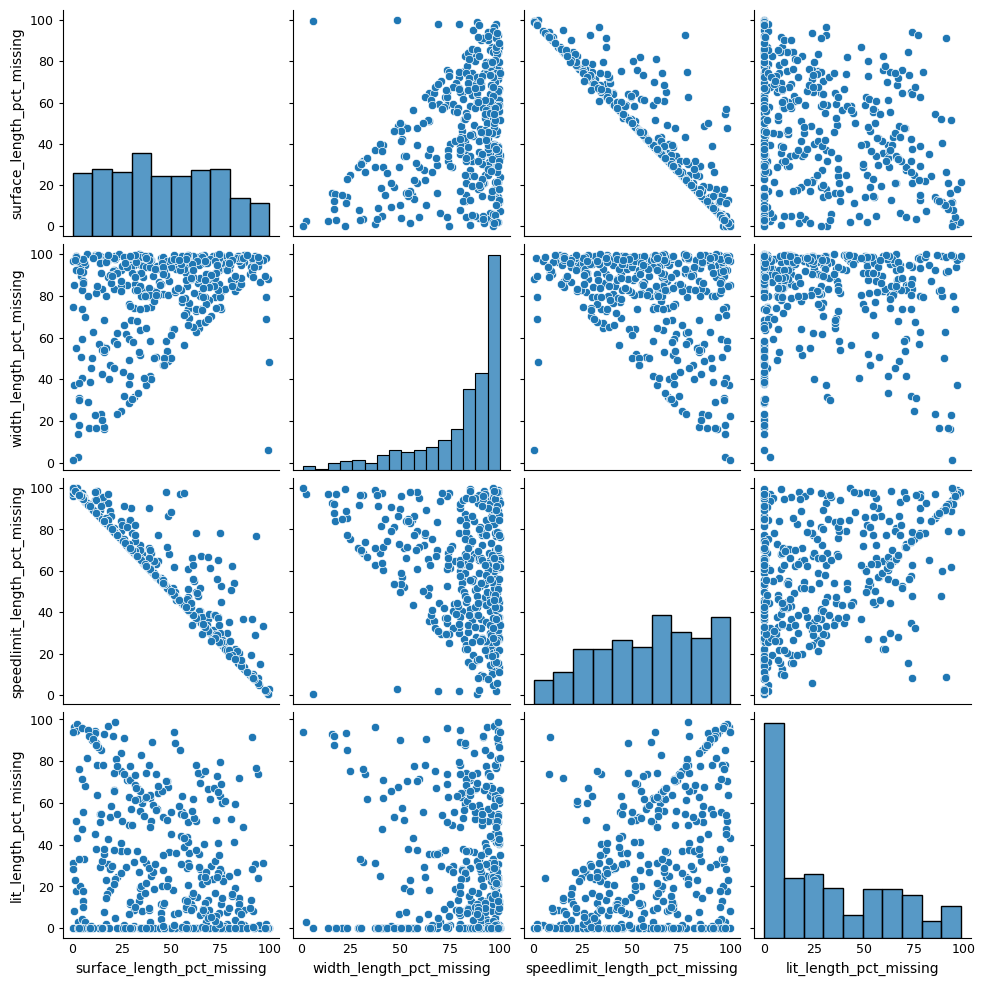

In [4]:
sns.pairplot(osm_intrinsic_grid[osm_intrinsic_grid[length_missing]<100][length_missing].dropna());

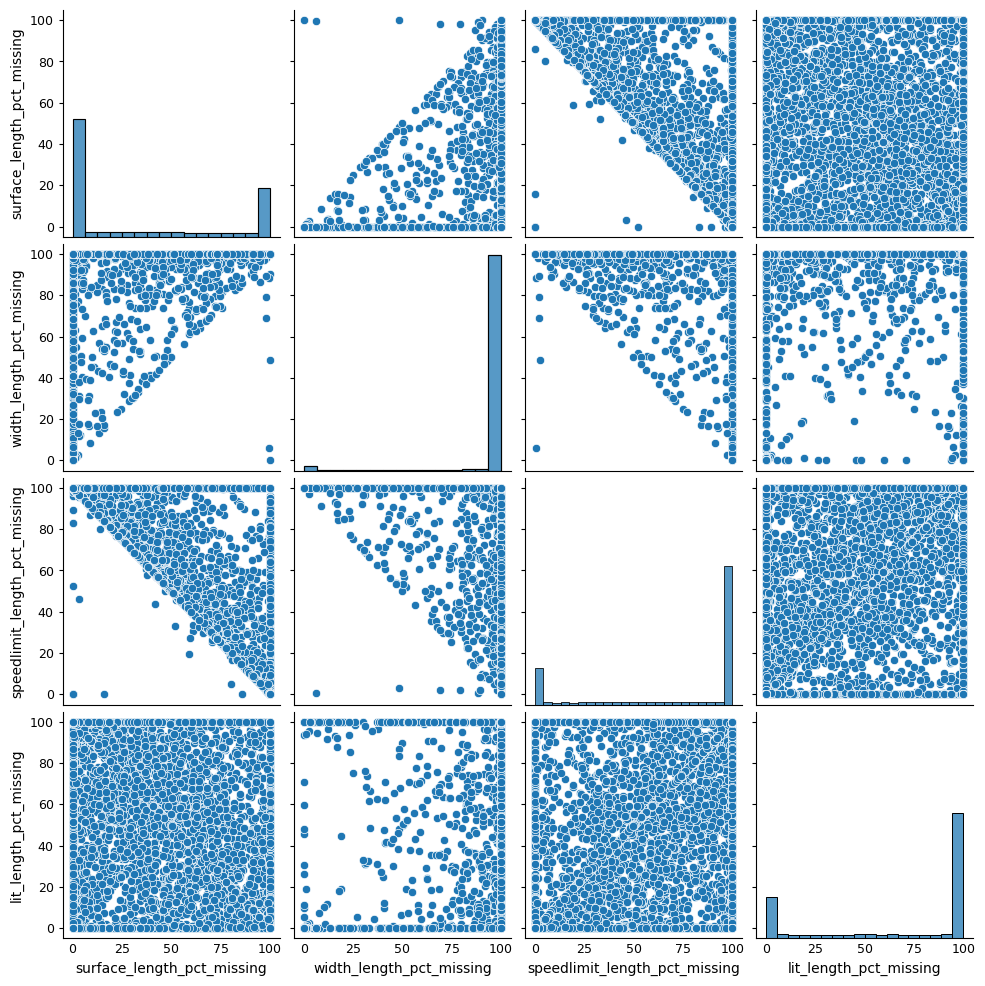

In [5]:
sns.pairplot(osm_intrinsic_grid[length_missing].dropna());

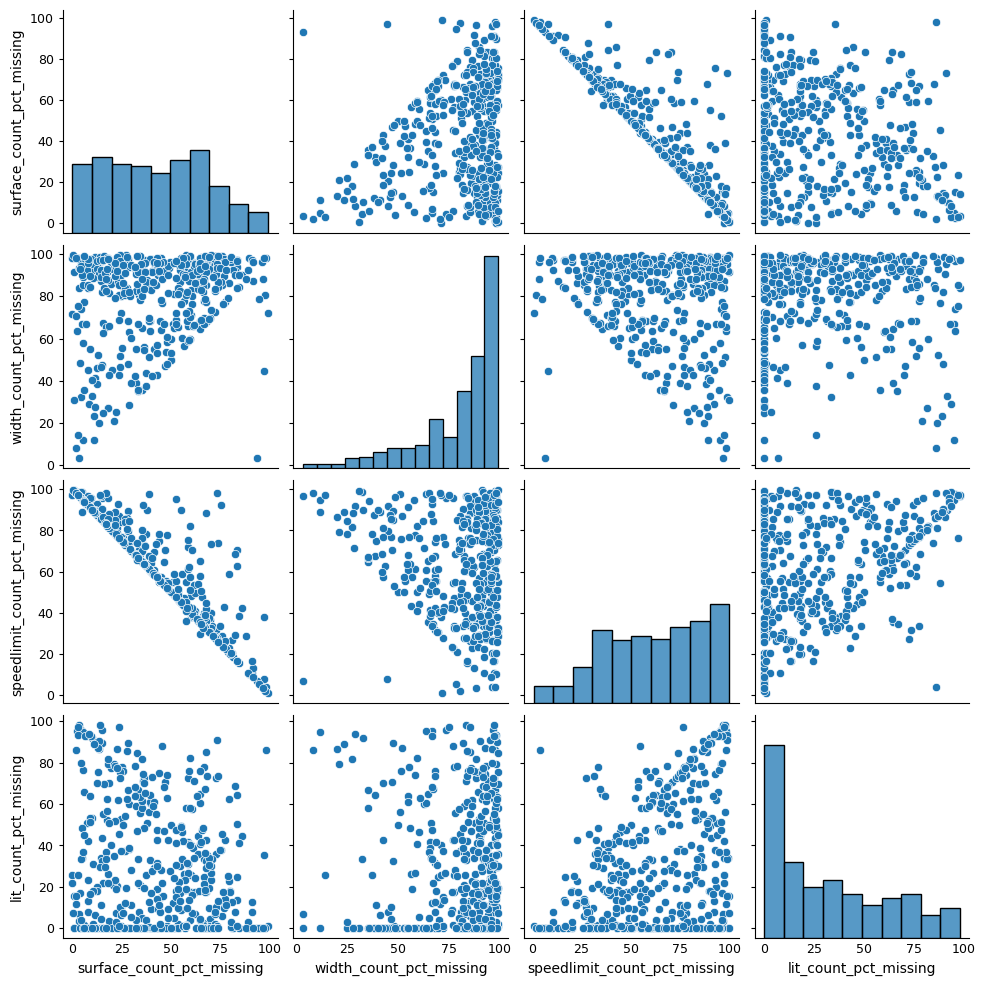

In [6]:
sns.pairplot(osm_intrinsic_grid[osm_intrinsic_grid[count_missing]<100][count_missing].dropna());

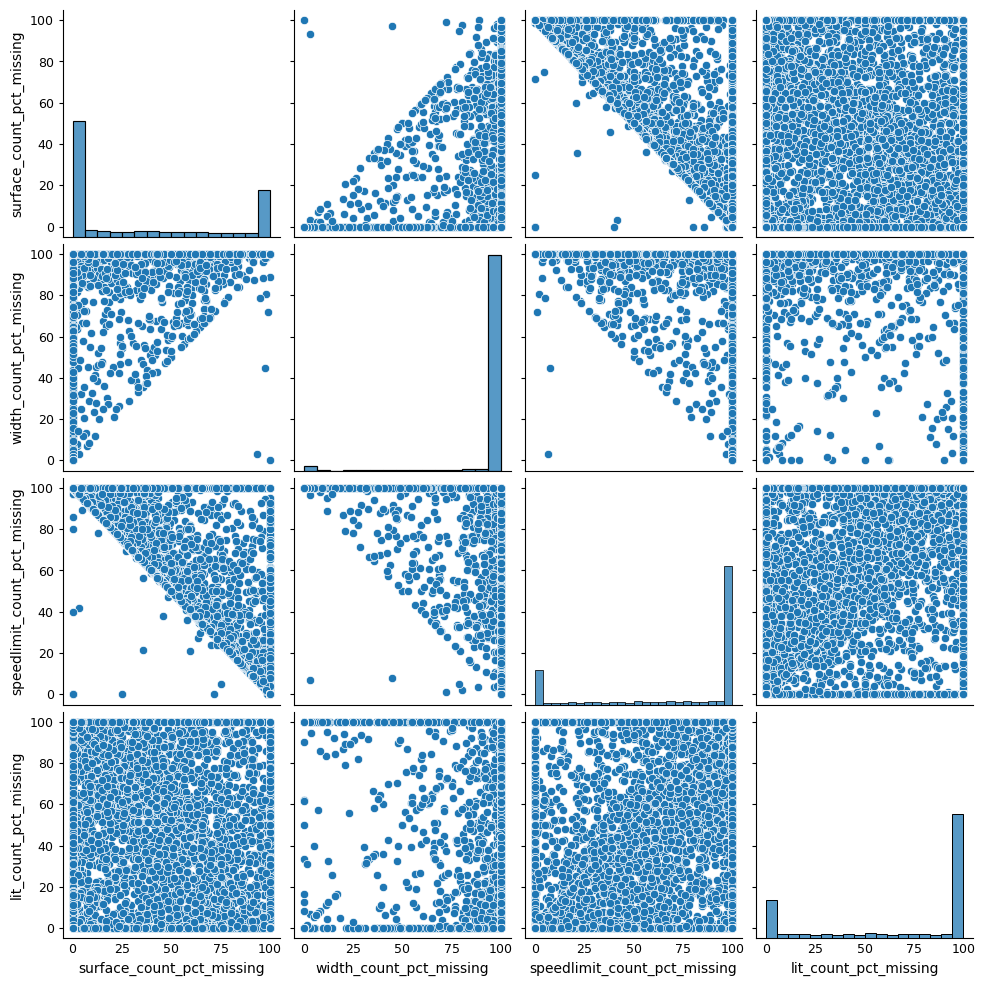

In [7]:
sns.pairplot(osm_intrinsic_grid[count_missing].dropna());

In [8]:

fig = px.scatter(
    osm_intrinsic_grid, 
    x='surface_count_pct_missing', 
    y='speedlimit_count_pct_missing',
    color="osm_edge_density",
    title='Correlation between missing tags', 
    color_continuous_scale='viridis_r',
    labels={
        "osm_edge_density": "edge density (m/sqkm)",
        "speedlimit_count_pct_missing": "Pct edges without speedlimit tag",
        "surface_count_pct_missing": "Pct edges without surface tag",
        })

fig.update_layout(
    font=dict(
        size=12,
        color="RebeccaPurple"
    )
)
fig.show()

In [9]:
fig = px.scatter(
    osm_intrinsic_grid, 
    x='surface_count_pct_missing', 
    y='lit_count_pct_missing',
    color="osm_edge_density",
    title='Correlation between missing tags', 
    color_continuous_scale='viridis_r',
    labels={
        "osm_edge_density": "edge density (m/sqkm)",
        "speedlimit_count_pct_missing": "Pct edges without speedlimit tag",
        "surface_count_pct_missing": "Pct edges without surface tag",
        })

fig.update_layout(
    font=dict(
        size=12,
        color="RebeccaPurple"
    )
)
fig.show()

/opt/miniconda3/envs/bikedna_analysis/lib/python3.11/site-packages/pysal/lib/weights/weights.py:170: UserWarning:

The weights matrix is not fully connected. There are 21 components



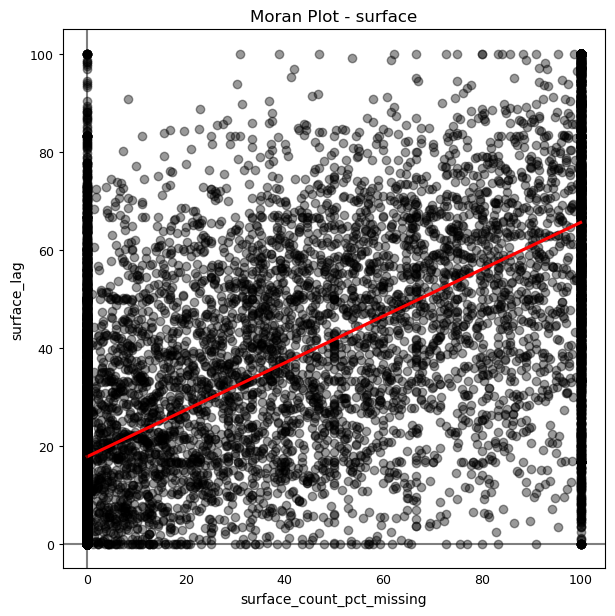

With significance 0.001, the Moran's I value for surface is 0.48


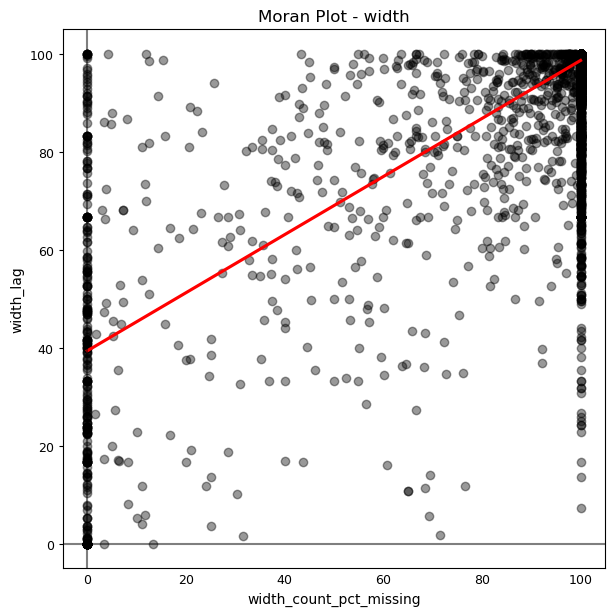

With significance 0.001, the Moran's I value for width is 0.59


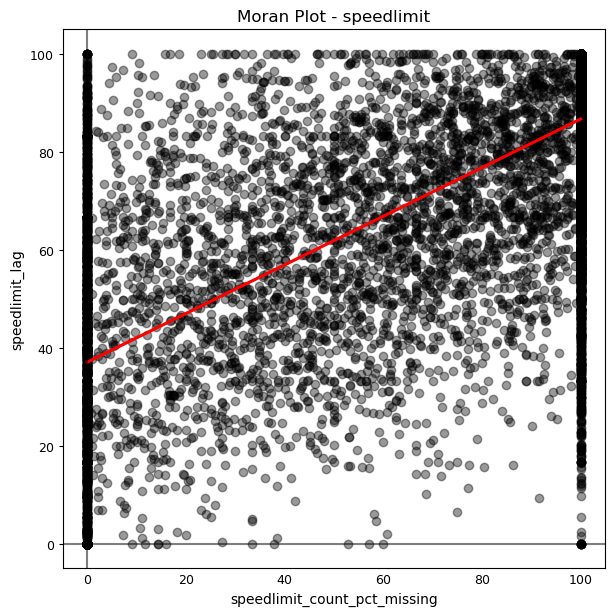

With significance 0.001, the Moran's I value for speedlimit is 0.50


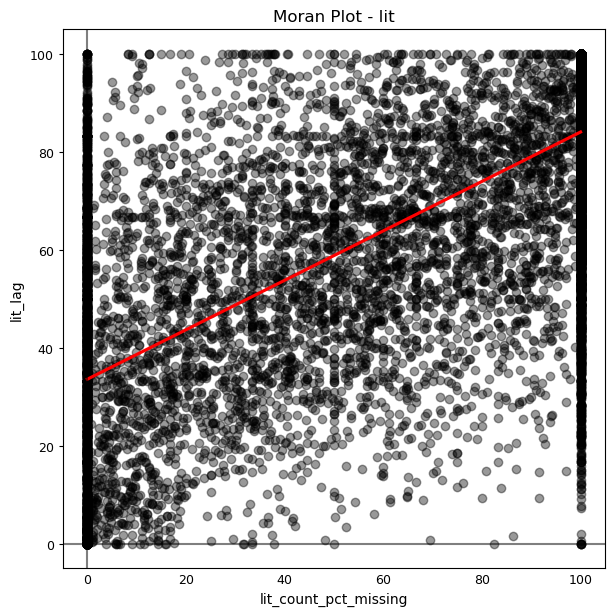

With significance 0.001, the Moran's I value for lit is 0.50


In [10]:
col_names = count_missing
variable_names = ['surface','width','speedlimit','lit']
filepaths = [osm_analysis_fp+"morans_surface_missing.png", osm_analysis_fp+"morans_width_missing.png", osm_analysis_fp+"morans_speedlimit_missing.png",osm_analysis_fp+"morans_lit_missing.png"]

w = eval_func.compute_spatial_weights(osm_intrinsic_grid, ["count_osm_edges"], "knn")

morans_tags = eval_func.compute_spatial_autocorrelation(col_names, variable_names, osm_intrinsic_grid, w, filepaths)

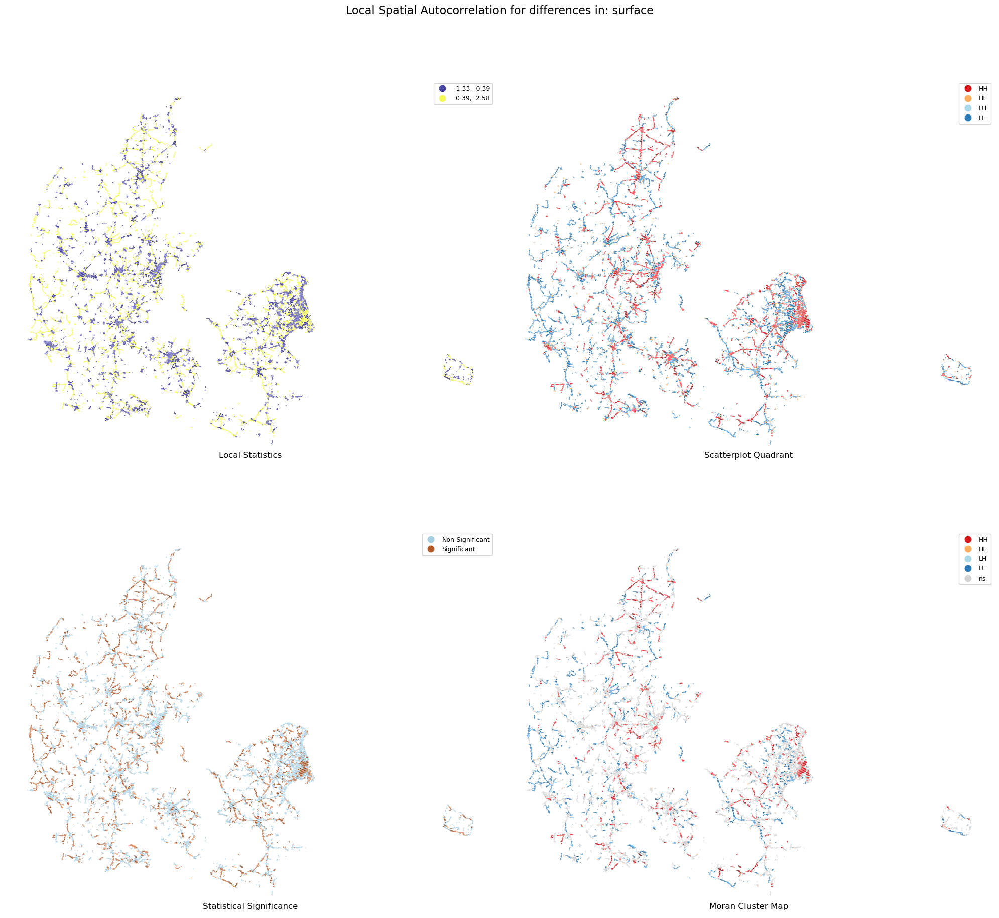

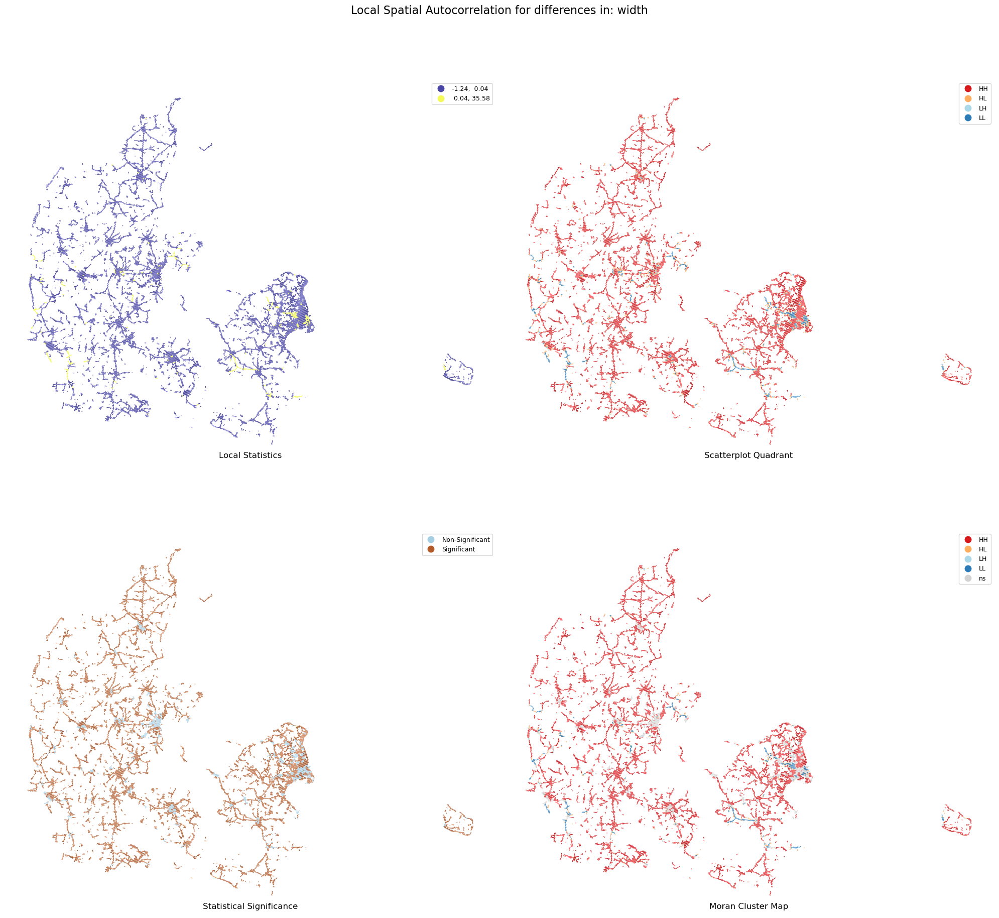

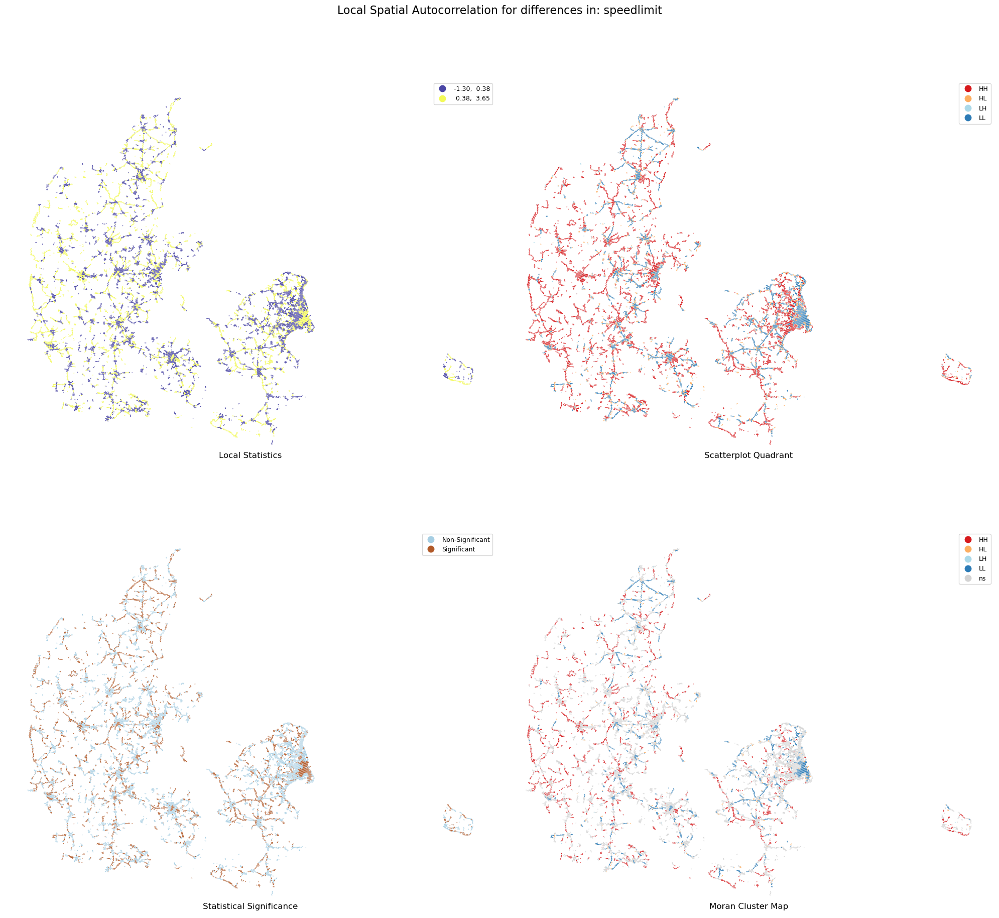

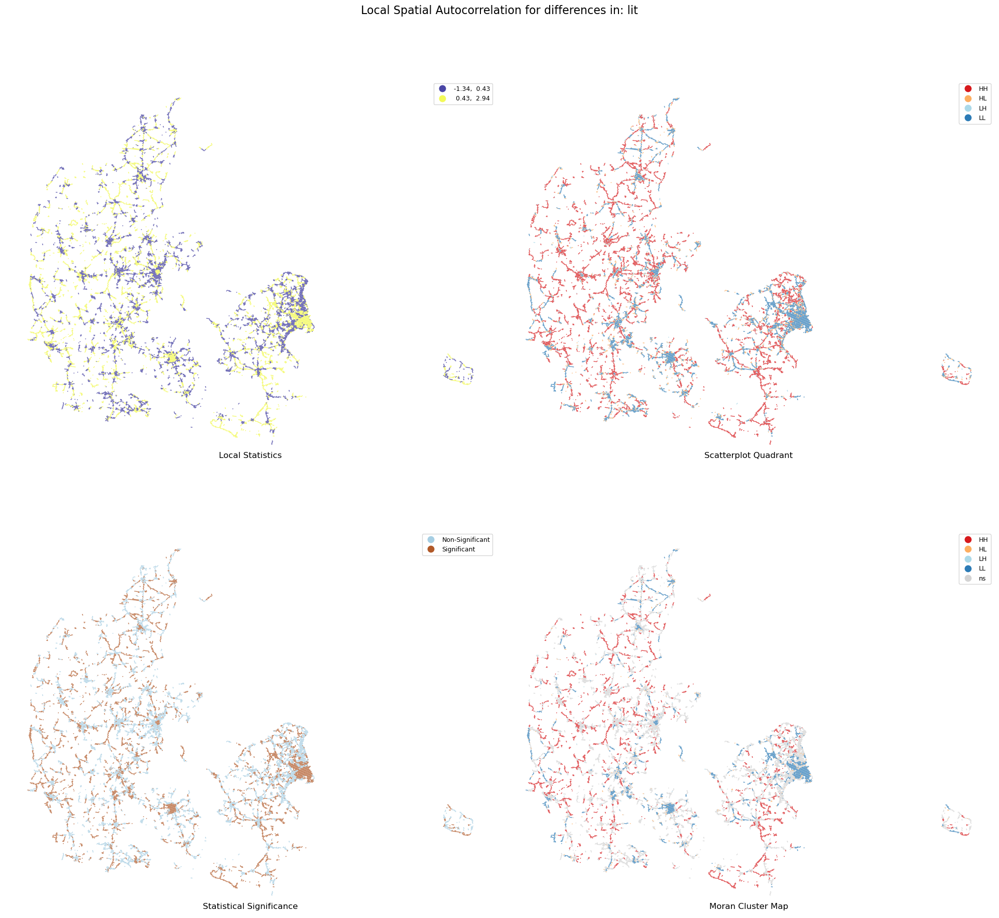

In [11]:
col_names = count_missing
variable_names = ['surface','width','speedlimit','lit']
filepaths = [osm_analysis_fp+"lisa_surface_missing.png", osm_analysis_fp+"lisa_width_missing.png", osm_analysis_fp+"lisa_speedlimit_missing.png",osm_analysis_fp+"lisa_lit_missing.png"]

lisas_tags = eval_func.compute_lisa(col_names, variable_names, osm_intrinsic_grid, w,filepaths)

In [12]:
for v in variable_names:
    hotspot = len(osm_intrinsic_grid[osm_intrinsic_grid[f"{v}_q"]=="HH"])
    coldspot = len(osm_intrinsic_grid[osm_intrinsic_grid[f"{v}_q"]=="LL"])

    print(f"For the tag '{v}', {hotspot} out of {len(osm_intrinsic_grid)} grid cells ({hotspot/len(osm_intrinsic_grid)*100:.2f}%) are part of a hotspot.")
    print(f"For the tag '{v}', {coldspot} out of {len(osm_intrinsic_grid)} grid cells ({coldspot/len(osm_intrinsic_grid)*100:.2f}%) are part of a coldspot.")
    print("\n")

For the tag 'surface', 2318 out of 14506 grid cells (15.98%) are part of a hotspot.
For the tag 'surface', 3340 out of 14506 grid cells (23.02%) are part of a coldspot.


For the tag 'width', 11807 out of 14506 grid cells (81.39%) are part of a hotspot.
For the tag 'width', 560 out of 14506 grid cells (3.86%) are part of a coldspot.


For the tag 'speedlimit', 2977 out of 14506 grid cells (20.52%) are part of a hotspot.
For the tag 'speedlimit', 2142 out of 14506 grid cells (14.77%) are part of a coldspot.


For the tag 'lit', 3584 out of 14506 grid cells (24.71%) are part of a hotspot.
For the tag 'lit', 2401 out of 14506 grid cells (16.55%) are part of a coldspot.




In [13]:
# Export
q_cols = [v+'_q' for v in variable_names]
q_cols.append("hex_id")
osm_intrinsic_grid[q_cols].to_csv(osm_analysis_fp + "missing_tags_spatial_autocorrelation.csv",index=True)

## Correlation between missing tags & population density

In [14]:
pop_grid = gpd.read_parquet(pop_processed_fp + "h3_population_polygons.parquet")

joined_grid = osm_intrinsic_grid.merge(pop_grid[['hex_id','pop_dens']],on="hex_id",how="inner")

assert len(joined_grid) == len(osm_intrinsic_grid)

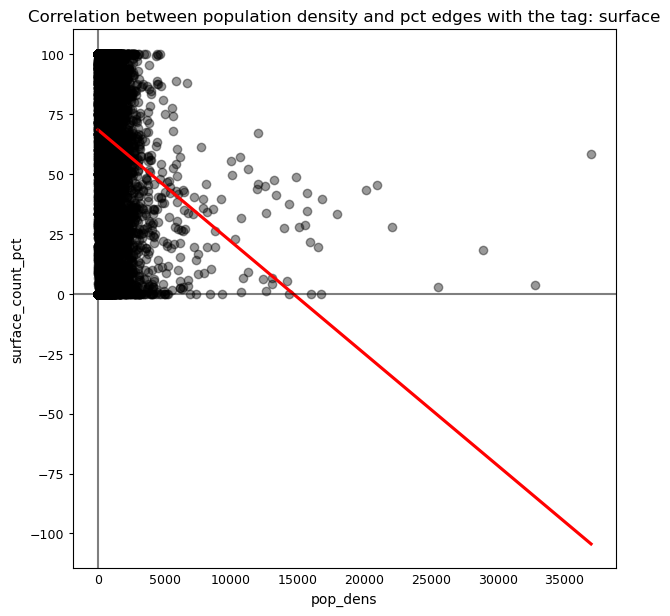

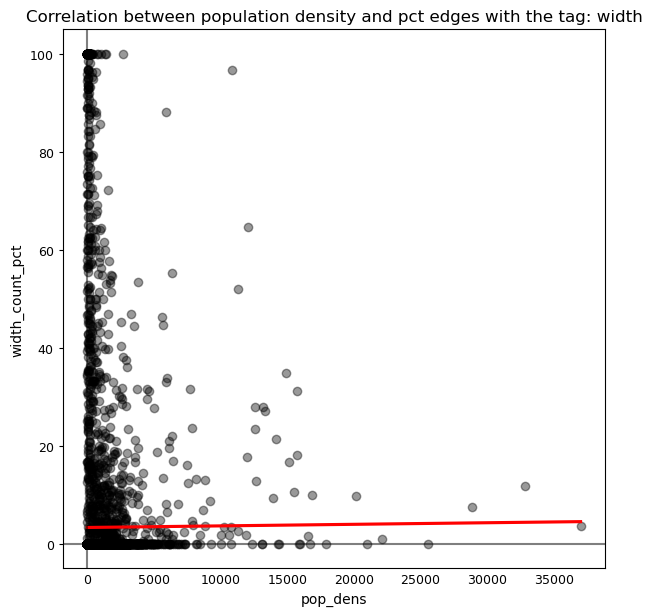

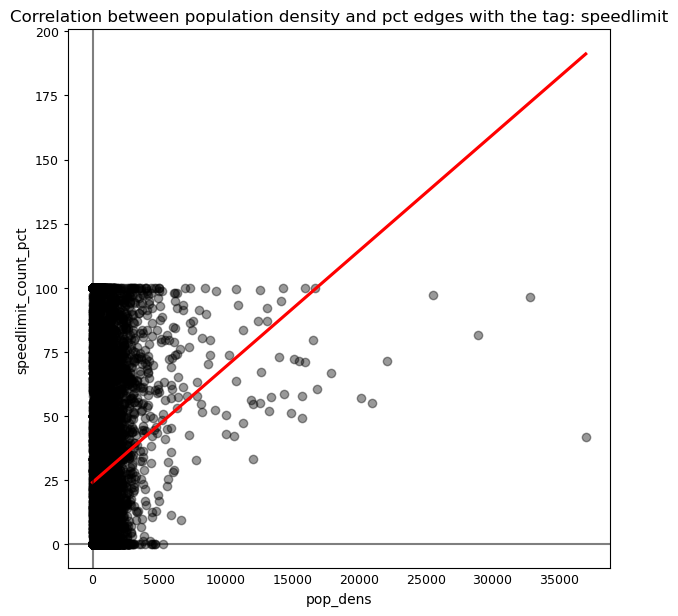

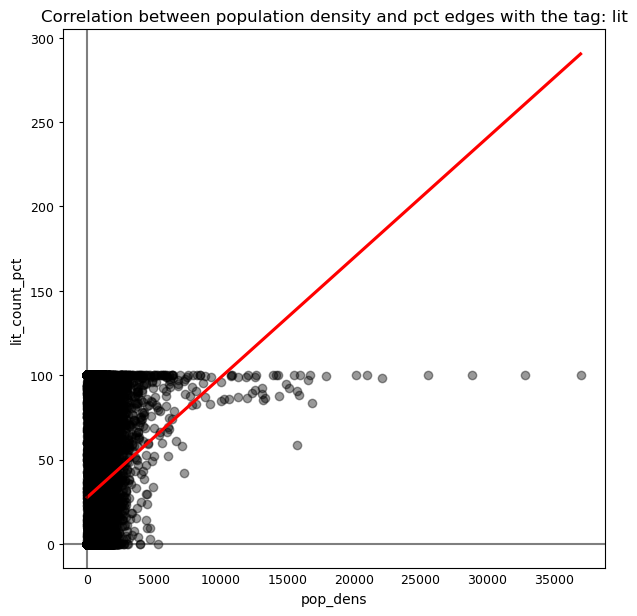

In [15]:
tag_types = ["surface", "width", "speedlimit", "lit"]

length_cols = [
    "surface_length_pct",
    "width_length_pct",
    "speedlimit_length_pct",
    "lit_length_pct",
]

count_cols = [
    "surface_count_pct",
    "width_count_pct",
    "speedlimit_count_pct",
    "lit_count_pct",
]

for i, t in enumerate(tag_types):
    f, ax = plt.subplots(1, figsize=(7, 7))

    sns.regplot(
        x="pop_dens",
        y=count_cols[i],
        ci=None,
        data=joined_grid,
        line_kws={"color": "r"},
        scatter_kws={"alpha": 0.4},
        color="black",
    )

    ax.axvline(0, c="k", alpha=0.5)
    ax.axhline(0, c="k", alpha=0.5)
    ax.set_title(
        f"Correlation between population density and pct edges with the tag: {t}"
    )
    plt.show()


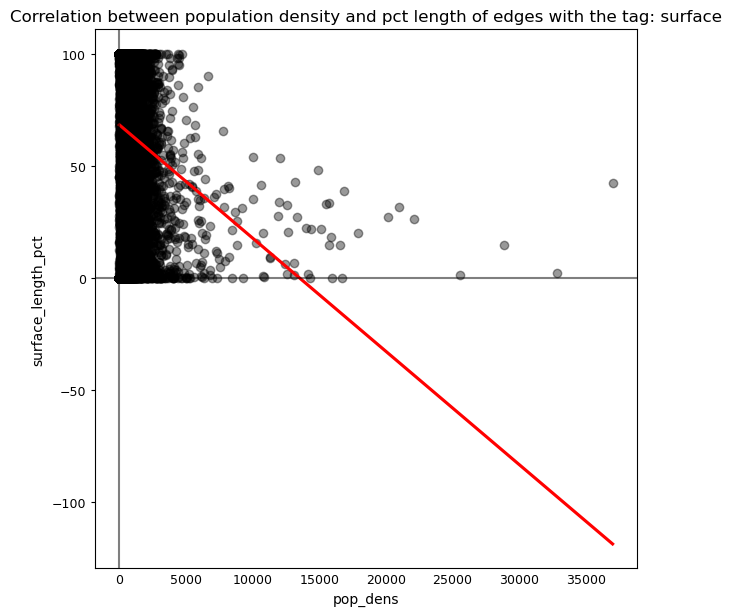

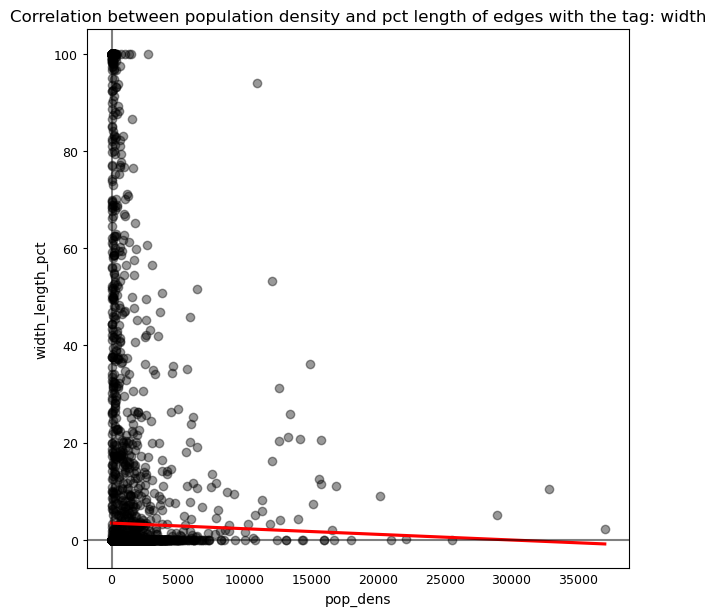

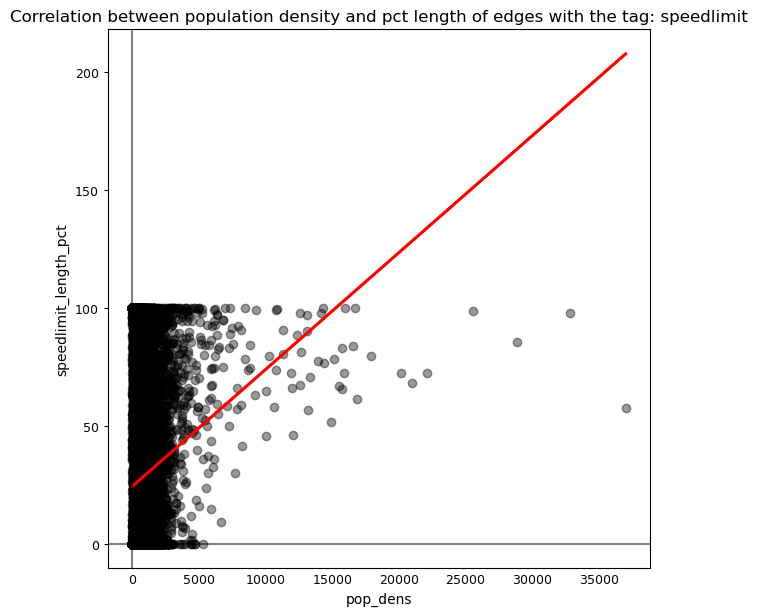

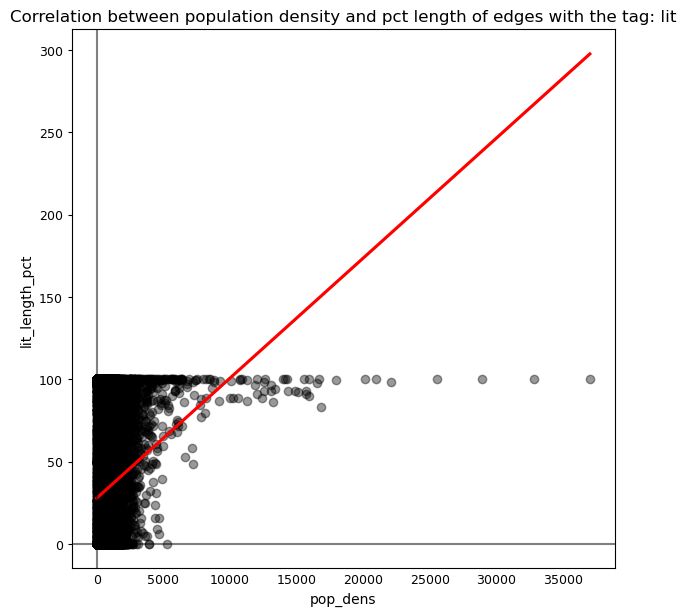

In [16]:

for i, t in enumerate(tag_types):
    f, ax = plt.subplots(1, figsize=(7,7))

    sns.regplot(
        x="pop_dens",
        y=length_cols[i],
        ci=None,
        data=joined_grid,
        line_kws={"color": "r"},
        scatter_kws={"alpha": 0.4},
        color="black",
    )

    ax.axvline(0, c="k", alpha=0.5)
    ax.axhline(0, c="k", alpha=0.5)
    ax.set_title(f"Correlation between population density and pct length of edges with the tag: {t}")
    plt.show()